<a href="https://colab.research.google.com/github/H20180190/deep-learning/blob/main/Copy_of_Welcome_To_Colaboratory.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
seed = 101

In [ ]:
#IMPORTING LIBRARIES
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

In [ ]:
import tensorflow
from tensorflow import keras
from keras.models import Sequential,load_model,Model
from keras.layers import Conv2D,MaxPool2D,AveragePooling2D,Dense,Flatten,ZeroPadding2D,BatchNormalization,Activation,Add,Input,Dropout,GlobalAveragePooling2D
from keras.initializers import glorot_uniform
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau
from keras.models import Sequential
from keras.applications.vgg16 import VGG16
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten, Input, Conv2D, multiply, LocallyConnected2D, Lambda,MaxPool2D
from keras.models import Model


In [ ]:
pip install rarfile

In [ ]:
import requests
import zipfile
import rarfile
rarpath='/content/drive/MyDrive/New Plant Diseases Dataset(Augmented).rar'

def unrar(file):
    rf=rarfile.RarFile(file)
    rf.extractall()

unrar(rarpath)



Number of images of Tomato___Spider_mites Two-spotted_spider_mite: 1741 || Number of images of Tomato___healthy: 1926 || Number of images of Corn_(maize)___healthy: 1859 || Number of images of Pepper,_bell___Bacterial_spot: 1913 || Number of images of Tomato___Septoria_leaf_spot: 1745 || Number of images of Apple___Cedar_apple_rust: 1760 || Number of images of Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1722 || Number of images of Raspberry___healthy: 1781 || Number of images of Apple___Apple_scab: 2016 || Number of images of Squash___Powdery_mildew: 1736 || Number of images of Corn_(maize)___Northern_Leaf_Blight: 1908 || Number of images of Tomato___Target_Spot: 1827 || Number of images of Soybean___healthy: 2022 || Number of images of Peach___healthy: 1728 || Number of images of Apple___healthy: 2008 || Number of images of Orange___Haunglongbing_(Citrus_greening): 2010 || Number of images of Corn_(maize)___Common_rust_: 1907 || Number of images of Peach___Bacterial_spot: 1838 || Numb

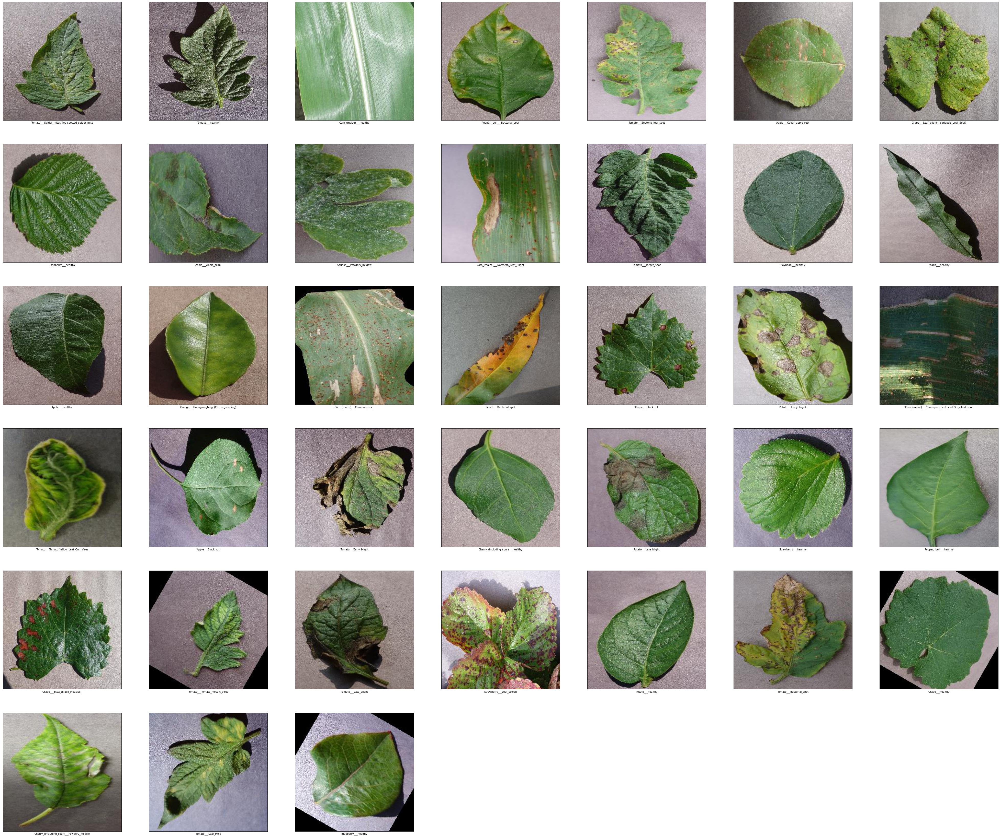

In [ ]:
path='/content/New Plant Diseases Dataset(Augmented)/train'
plt.figure(figsize=(70,70))
count=0
plant_names=[]
total_images=0
for i in os.listdir(path):
  count+=1
  plant_names.append(i)
  plt.subplot(7,7,count)

  images_path=os.listdir(path+"/"+i)
  print("Number of images of "+i+":",len(images_path),"||",end=" ")
  total_images+=len(images_path)

  image_show=plt.imread(path+"/"+i+"/"+images_path[0])
  
  plt.imshow(image_show)
  plt.xlabel(i)
  
  plt.xticks([])
  plt.yticks([])

In [ ]:
print("Total number of images we have",total_images)

Total number of images we have 70295


In [ ]:
print(plant_names)

['Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___healthy', 'Corn_(maize)___healthy', 'Pepper,_bell___Bacterial_spot', 'Tomato___Septoria_leaf_spot', 'Apple___Cedar_apple_rust', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Raspberry___healthy', 'Apple___Apple_scab', 'Squash___Powdery_mildew', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Target_Spot', 'Soybean___healthy', 'Peach___healthy', 'Apple___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Corn_(maize)___Common_rust_', 'Peach___Bacterial_spot', 'Grape___Black_rot', 'Potato___Early_blight', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Apple___Black_rot', 'Tomato___Early_blight', 'Cherry_(including_sour)___healthy', 'Potato___Late_blight', 'Strawberry___healthy', 'Pepper,_bell___healthy', 'Grape___Esca_(Black_Measles)', 'Tomato___Tomato_mosaic_virus', 'Tomato___Late_blight', 'Strawberry___Leaf_scorch', 'Potato___healthy', 'Tomato___Bacterial_spot', 'Grape___

In [ ]:
print(len(plant_names))

38


In [ ]:
#Image augmentation
train_datagen= ImageDataGenerator(rotation_range = 40,
       rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=False,vertical_flip=False
                                  ,fill_mode='nearest',width_shift_range=0.2,height_shift_range=0.2)

val_datagen=ImageDataGenerator(rotation_range = 40,
       rescale=1./255,)

path_train='/content/New Plant Diseases Dataset(Augmented)/train'

path_valid='/content/New Plant Diseases Dataset(Augmented)/valid'

train= train_datagen.flow_from_directory(directory=path_train,batch_size=32,target_size=(224,224),
                                         color_mode='rgb',class_mode='categorical',seed=42)

valid=val_datagen.flow_from_directory(directory=path_valid,batch_size=32,target_size=(224,224),color_mode='rgb',class_mode='categorical')

Found 70295 images belonging to 38 classes.
Found 8822 images belonging to 38 classes.


In [ ]:
tes_datagen=ImageDataGenerator(rotation_range = 40,
       rescale=1./255,)
path_test='/content/New Plant Diseases Dataset(Augmented)/test'

test= tes_datagen.flow_from_directory(directory=path_test,batch_size=32,target_size=(224,224),
                                         color_mode='rgb',class_mode='categorical',seed=42)

Found 8750 images belonging to 38 classes.


In [ ]:
base_model_tf=VGG16(include_top=False,weights='imagenet',input_shape=(224,224,3))

58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
#Model building
base_model_tf.trainable=False
x = base_model_tf.output
#model_VGG16=base_model_tf(x,training=False)
model_VGG16=GlobalAveragePooling2D()(x)
model_VGG16=Dense(128,activation='relu')(model_VGG16)
model_VGG16=Dense(64,activation='relu')(model_VGG16)
model_VGG16=Dense(38,activation='softmax')(model_VGG16)


model_main=Model(inputs=base_model_tf.input,outputs=model_VGG16)
model_main.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
#CallBacks
es=EarlyStopping(monitor='val_accuracy',verbose=1,patience=7,mode='auto')
mc=ModelCheckpoint(filepath='/content',monitor='val_accuracy',verbose=1,save_best_only=True)
lr=ReduceLROnPlateau(monitor='val_accuracy',verbose=1,patience=5,min_lr=0.001)

In [ ]:
model_main.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
#Training
model_main.fit(train,validation_data=valid,epochs=30,steps_per_epoch=200,verbose=1,callbacks=[mc,es,lr])

Epoch 1/30
200/200 [==============================] - ETA: 0s - loss: 3.1566 - accuracy: 0.1683
Epoch 1: val_accuracy improved from -inf to 0.37010, saving model to /content
INFO:tensorflow:Assets written to: /content/assets
200/200 [==============================] - 214s 1s/step - loss: 3.1566 - accuracy: 0.1683 - val_loss: 2.3410 - val_accuracy: 0.3701 - lr: 0.0010
Epoch 2/30
 97/200 [=============>................] - ETA: 42s - loss: 2.1727 - accuracy: 0.4017

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from PIL import Image

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(model_main.history.history['loss'],color='b',label='Training loss')
plt.plot(model_main.history.history['val_loss'],color='r',label='Validation loss')
plt.xlabel("epochs")
plt.ylabel("loss_value")
plt.title("loss")

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(model_main.history.history['accuracy'],color='b',label='Training accuracy')
plt.plot(model_main.history.history['val_accuracy'],color='r',label='Validation accsuracy')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.title("accuracy graph")

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(model_main.history.history['accuracy'],color='b',label='Training accuracy')
plt.plot(model_main.history.history['val_accuracy'],color='r',label='Validation accsuracy')
plt.title('Confusion Matrix')
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show();